### Data Exploration - Data Visualisation

In [1]:
# import libraries
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
import sys




In [2]:
# Read the customers dataset
df=pd.read_csv('customers.csv')
df.head()


,ID,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size
0,462809,Male,No,22,No,Healthcare,1.0,Low,4.0
1,462643,Female,Yes,38,Yes,Engineer,NaN,Average,3.0
2,466315,Female,Yes,67,Yes,Engineer,1.0,Low,1.0
3,461735,Male,Yes,67,Yes,Lawyer,0.0,High,2.0
4,462669,Female,Yes,40,Yes,Entertainment,NaN,High,6.0


In [3]:
print('Number of rows and columns: '+str((df.shape)))
print('')
print('Column types:')
print('')
print(df.info())

Number of rows and columns: (8068, 9)

Column types:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8068 entries, 0 to 8067
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ID               8068 non-null   int64  
 1   Gender           8068 non-null   object 
 2   Ever_Married     7928 non-null   object 
 3   Age              8068 non-null   int64  
 4   Graduated        7990 non-null   object 
 5   Profession       7944 non-null   object 
 6   Work_Experience  7239 non-null   float64
 7   Spending_Score   8068 non-null   object 
 8   Family_Size      7733 non-null   float64
dtypes: float64(2), int64(2), object(5)
memory usage: 567.4+ KB
None


### Missing values identified above, but let's take a further look into the statistics of each column below:

In [4]:
df.describe(include='all')

,ID,Gender,Ever_Married,Age,Graduated,Profession,Work_Experience,Spending_Score,Family_Size
count,8068.000000,8068,7928,8068.000000,7990,7944,7239.000000,8068,7733.000000
unique,NaN,2,2,NaN,2,9,NaN,3,NaN
top,NaN,Male,Yes,NaN,Yes,Artist,NaN,Low,NaN
freq,NaN,4417,4643,NaN,4968,2516,NaN,4878,NaN
mean,463479.214551,NaN,NaN,43.466906,NaN,NaN,2.641663,NaN,2.850123
std,2595.381232,NaN,NaN,16.711696,NaN,NaN,3.406763,NaN,1.531413
min,458982.000000,NaN,NaN,18.000000,NaN,NaN,0.000000,NaN,1.000000
25%,461240.750000,NaN,NaN,30.000000,NaN,NaN,0.000000,NaN,2.000000
50%,463472.500000,NaN,NaN,40.000000,NaN,NaN,1.000000,NaN,3.000000
75%,465744.250000,NaN,NaN,53.000000,NaN,NaN,4.000000,NaN,4.000000


### Let's define some functions that will help us do the visualisation

In [5]:
def aggr_table(df,x,sort=False):
    """Creates count,cumulative count and the equivalent % columns for a specific field in a df

    Args:
    df: The dataframe
    x: string. The column in the dataframe we group by

    Returns:
    A table with count, cumulative count, count% and cumulative count% for the given column.
    """
    
    aggr=df.groupby(x).size().reset_index(name='Count')    # Create the groupby and the first metric
    y_per_cent='Count %'    # Will be used as the name of the fourth metric
    aggr[y_per_cent]=round(100*aggr['Count']/sum(aggr['Count']),1)    # Count %

    if not sort and pd.api.types.is_numeric_dtype(df[x]):
        cum_name='Cumulative Count'   # Name of the second metric created
        cum_name_per_cent=cum_name+' %'    # Name of the third metric created
        aggr[cum_name]=aggr['Count'].cumsum()    # Cumulative count created
        aggr[cum_name_per_cent]=round(100*aggr[cum_name]/sum(aggr['Count']),1)    # Cumulative count %
    
    
    return aggr

In [6]:
def metric_convert(metric):
    """This function will be used for the function below. It just saves the user from submitting long argument names

    Args:
    metric: string.The argument that will be passed in the function aggr_graph below. 
    
    Returns:
    The full name of the metric
    """
    
    if metric=='Cum Count':
        metric='Cumulative Count'
        
    elif metric=='Cum Count %':
        metric='Cumulative Count %'
     
    elif metric=='Count' or metric=='Count %':
        metric=metric
    
    else: 
        print('Please give a valid metric name')
        sys.exit()
    
    return metric     

In [7]:
def aggr_graph(df, x, metric, kind, show_val=True, h_line=None, bins=5, return_table=False, sort=False, ascend=True,missing_mode='detailed'):

    """Creates a graph for a specific feature of a dataframe following a specific metric

    Args:
    df: The dataframe
    x: The feature being visualised (string)
    metric: The metric used in the visualisation. Accepted values are the below ONLY:
            'Count','Count %','Cum Count' for Cumulative Count and 'Cum Count %' for Cumulative Count %
    kind: The kind of plot. Please give one of these ONLY: 'pie','bar','barh' or 'hist'.
    bins: Number of categories for the histogram
    show_val: If True, the values of the feature will appear in the graph. 
    h_line: Optional. Creates horizontal line
    return_table: If True it will also provide the table of the values in the graph
    sort: For bar chart ONLY: If True it will sort the bars by value rather than alphabetically.
    ascend: Use it only if sort argument is True. It's the order by which bars will be sorted. Use True for ascending
    missing_mode: Used in pie chart only. Detailed: Adds missing as a new category. Binary: Presents missing vs non-missing 
    
    Returns:
    The graph. Pie chart, bar chart or histogram.
    """
        
    
    aggr=aggr_table(df,x,sort)    # The aggregate by this feature created. 
    if sort:
        aggr=aggr.sort_values(by='Count',ascending=ascend)    # Aggr table sorted if needed
        
    
    if kind == 'pie':
        total = len(df)
        missing_count = df[x].isna().sum()
        non_missing_count = total - missing_count
    
        if missing_mode == 'binary':
            # Binary pie: Missing vs Non-missing
            pie_df = pd.DataFrame({
                x: ['Non-missing', 'Missing'],
                'Count': [non_missing_count, missing_count],
                'Count %': [
                    non_missing_count / total * 100,
                    missing_count / total * 100
                ]
            })
    
        else:
            # Detailed pie: categories + Missing
            pie_df = aggr_table(df, x)
    
            if missing_count > 0:
                missing_row = {
                    x: 'Missing',
                    'Count': missing_count,
                    'Count %': missing_count / total * 100
                }
                pie_df = pd.concat(
                    [pie_df, pd.DataFrame([missing_row])],
                    ignore_index=True
                )
    
        pie_df.plot(
            kind='pie',
            y='Count %',
            labels=pie_df[x],
            autopct='%1.1f%%',
            legend=False
        )
    
        title = f'Distribution of {x}'
    
        plt.ylabel('')  # Removes the default y-axis label for clarity

      # Move legend outside the pie chart
        plt.legend(title=x, bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
         
    elif kind=='bar' or kind=='barh':
        metric=metric_convert(metric)    # Function above used to convert the metric to its full name

        plt.figure(figsize=(12, 12))
        aggr.plot(x=x,y=metric,kind=kind)    # Graph created
        
        plt.xticks(rotation=45)
        
        # Labels created below
        
        if kind == 'bar':
            plt.xlabel(x)
            plt.ylabel(metric)
        else:
            plt.xlabel(metric)
            plt.ylabel(x)
        
        title='Count of Customers by '+x  



    elif kind == 'hist':

    
        fig, ax = plt.subplots(figsize=(8, 6))
    
        data = df[x].dropna()

        min_val = data.min()
        max_val = data.max()
        
        bin_edges = np.linspace(min_val - 0.5,max_val + 0.5,bins + 1)

    
        counts, bin_edges, patches = ax.hist(data,bins=bin_edges,edgecolor='black')

    
        ax.set_xlabel(x)
        ax.set_ylabel('Frequency')
        title = f'Count of Customers by {x}'
    
        # --- BIN LABELS ---
        bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

        bin_labels = [f"{int(np.ceil(bin_edges[i]))}–{int(np.floor(bin_edges[i+1]))}"
            for i in range(len(bin_edges) - 1)]

    
        ax.set_xticks(bin_centers)
        ax.set_xticklabels(bin_labels, rotation=45, ha='right')
    
        # --- BIN FREQUENCIES ---
        if show_val:
            for count, patch in zip(counts, patches):
                if count > 0:
                    x_pos = patch.get_x() + patch.get_width() / 2
                    ax.text(
                        x_pos,
                        count,
                        int(count),
                        ha='center',
                        va='bottom',
                        fontsize=9
                    )

    
   
    # If statements below create horizontal line and show the values if requested 
    if h_line is not None:
        plt.axhline(y=h_line, color='r', linestyle='--')
    if show_val and kind == 'barh':
        for i, value in enumerate(aggr[metric]):
           plt.text(value * 0.95, i, str(value), va='center', ha='right', color='black')
    
    elif show_val and kind!='pie' and kind!='hist':
        for i, value in enumerate(aggr[metric]):
           plt.text(i, value , str(value), ha='center', va='bottom')
        
    plt.title(title)    # Title added
        
    plt.show()    # Display the chart
    
    # Table with values appears below the graph if requested
    if return_table:
        return aggr

### Before creating graphs, let's check for missing values as it would be interesting to visualise them among other categories

In [8]:
df.isnull().sum()

ID                   0
Gender               0
Ever_Married       140
Age                  0
Graduated           78
Profession         124
Work_Experience    829
Spending_Score       0
Family_Size        335
dtype: int64

### Five variables have missing values
### Let's start the visualisation

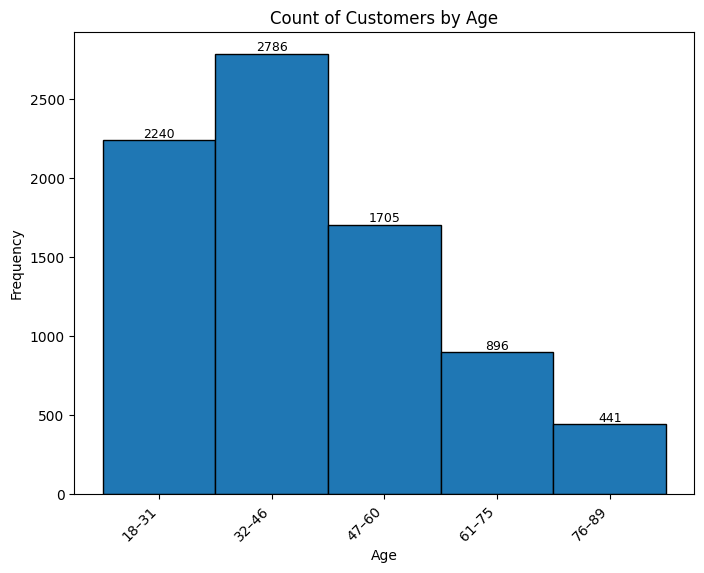

In [9]:
# Distribution of Age
aggr_graph(df,'Age','Count','hist',bins=5)



### Positively skewed distribution - Median is around 40 years of age

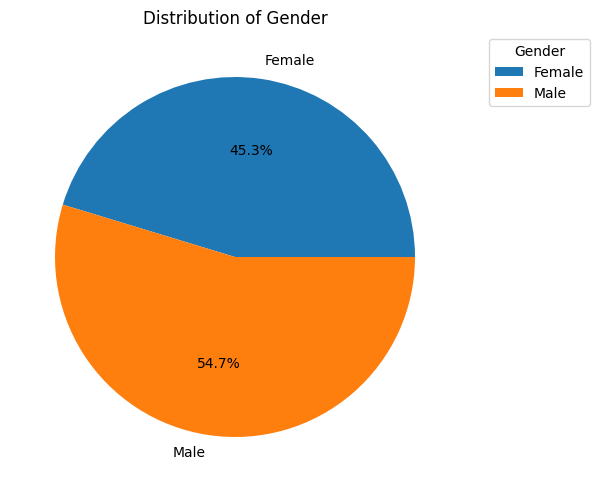

In [10]:
# Distribution of Gender
aggr_graph(df,'Gender','Count %','pie')

### More Male than Female - Not a big difference though

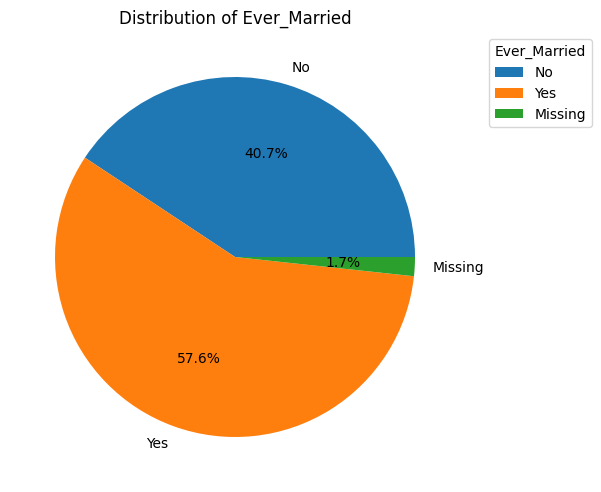

In [11]:
# Distribution of Ever Married
aggr_graph(df,'Ever_Married','Count %','pie')


### * Two distinct categories here (not a very dominant one) plus a substantial proportion of missing values. 
### * That could be a third category in our segmentation.

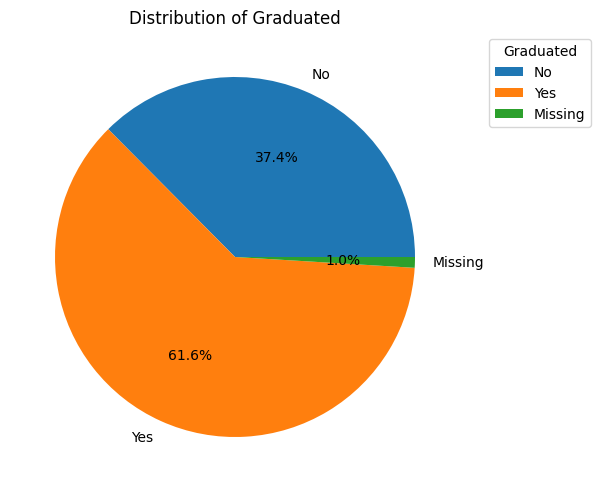

In [12]:
# Distribution of Graduated or not
aggr_graph(df,'Graduated','Count %','pie')

### * More Graduated than non-Graduated customers, but the latter form a very substantial category too
### * 1% of customers didn't provide their Graduated status

<Figure size 1200x1200 with 0 Axes>

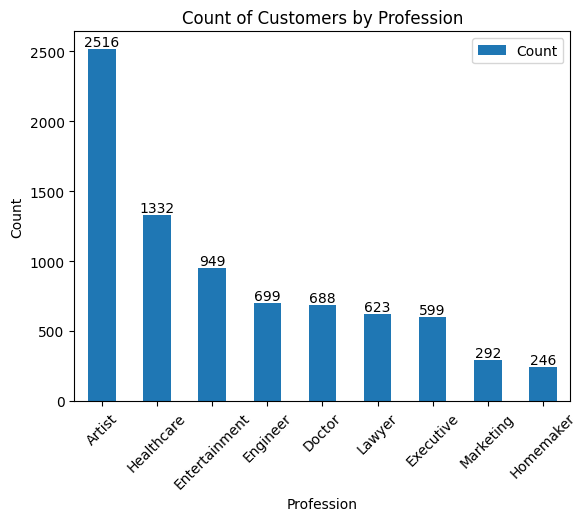

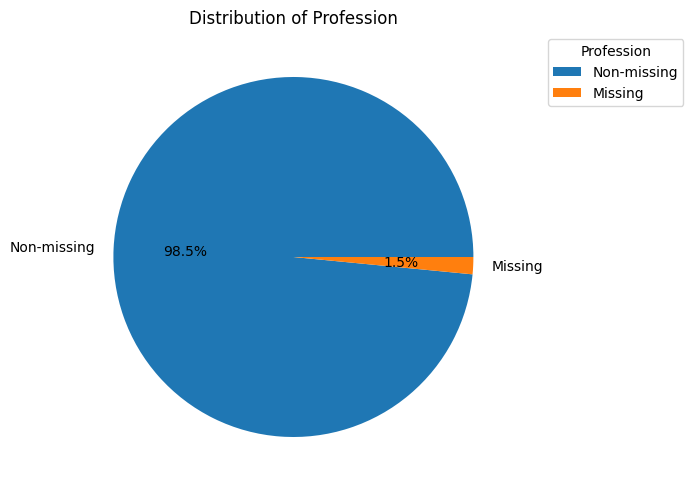

In [13]:
# Distribution of Profession

aggr_graph(df,'Profession','Count','bar',sort=True,ascend=False)
aggr_graph(df,'Profession','Count %','pie',missing_mode='binary')



### * Artist is the biggest category here (almost double compared to the second one), but even the least populated categories (Marketing, Homemaker) are considerable

### * 1.5% missing could also form a category in the clustering algorithm

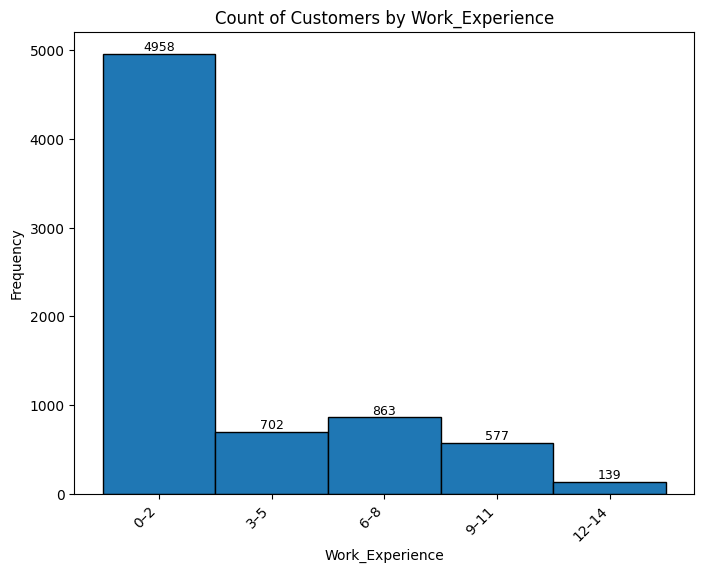

,Work_Experience,Count,Count %,Cumulative Count,Cumulative Count %
0,0.0,2318,32.0,2318,32.0
1,1.0,2354,32.5,4672,64.5
2,2.0,286,4.0,4958,68.5
3,3.0,255,3.5,5213,72.0
4,4.0,253,3.5,5466,75.5
5,5.0,194,2.7,5660,78.2
6,6.0,204,2.8,5864,81.0
7,7.0,196,2.7,6060,83.7
8,8.0,463,6.4,6523,90.1
9,9.0,474,6.5,6997,96.7


In [14]:
# Distribution of Work Experience
aggr_graph(df,'Work_Experience','Count','hist',bins=5,return_table=True)

### * Vast majority of Work Experience values is between 0 and 2 years. 
### * As the table shows, almost two thirds of the customers who provided a reply (non-missing) have up to 1 year of experience

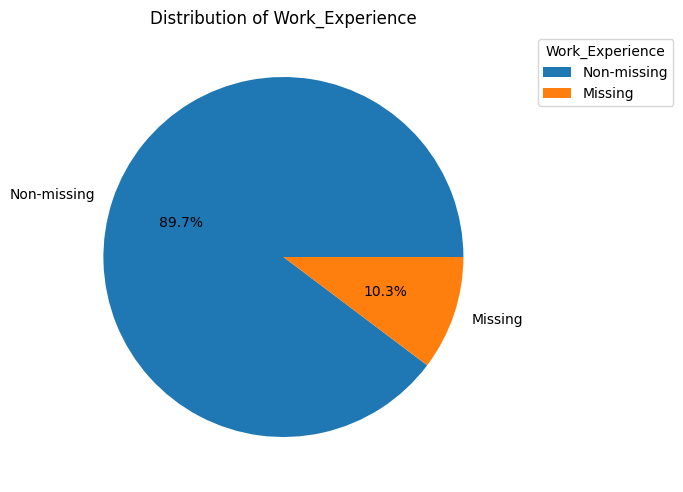

In [15]:
# Looking for missing values in Work Expereince
aggr_graph(df,'Work_Experience','Count %','pie',missing_mode='binary')

### Missing is a very considerable proportion of customers

<Figure size 1200x1200 with 0 Axes>

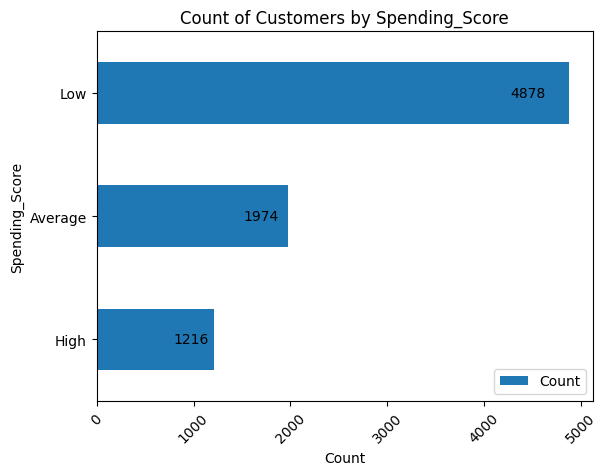

In [16]:
# Distribution of Spending Score
aggr_graph(df,'Spending_Score','Count','barh',sort=True,ascend=True)

### All 3 categories are substantially populated 

<Figure size 1200x1200 with 0 Axes>

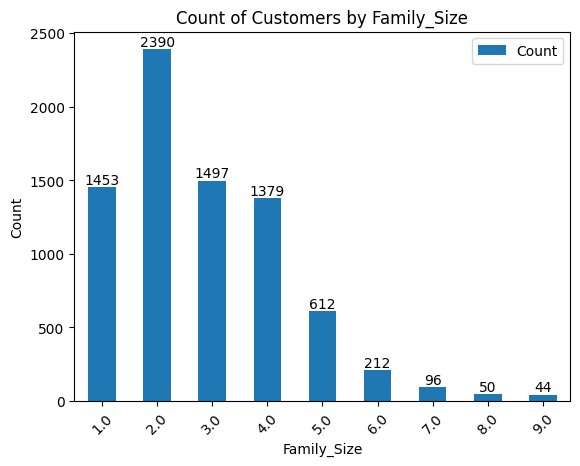

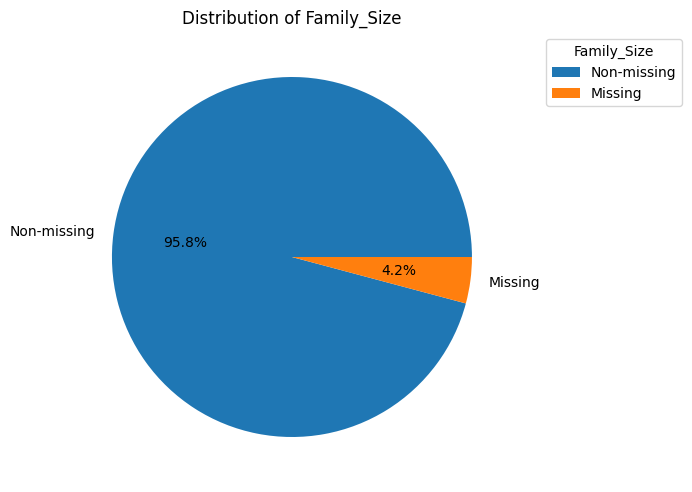

In [17]:
# Distribution of Family Size
aggr_graph(df,'Family_Size','Count','bar')
aggr_graph(df,'Family_Size','Count %','pie',missing_mode='binary')

### * Positively skewed with the median of around 3 
### * Missing is here too a considerable proportion which can't be dropped from the dataset

### Before proceeding let's check for any strong correlation between features

In [18]:
# Encode categorical variables (apart from ID which is not an actual variable)
encoded_df = pd.get_dummies(df.drop('ID',axis=1), drop_first=True)

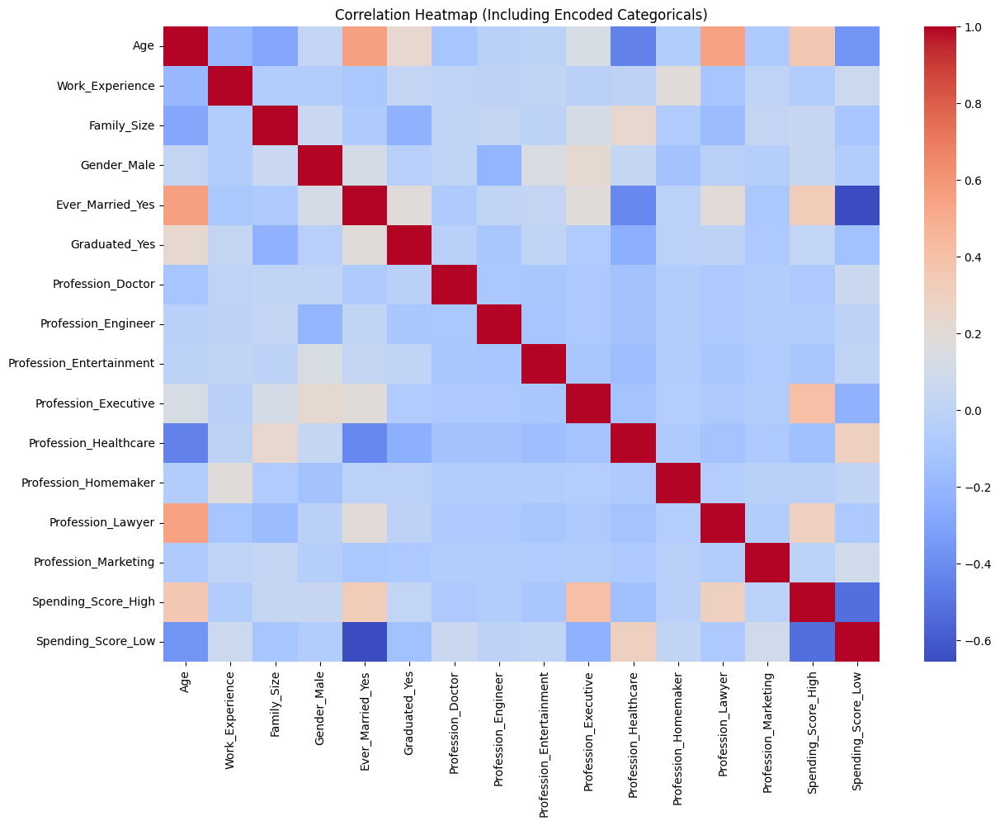

In [19]:
# Compute correlation on the encoded data
corr = encoded_df.corr()

# Plot heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(corr, cmap='coolwarm')
plt.title("Correlation Heatmap (Including Encoded Categoricals)")
plt.show()

### It appears from the heatmap above that age is correlated (either way) with a few other variables (ever married, spending score and certain professions)

In [20]:
print('Correlation between Age and Ever Married:',round(corr['Age']['Ever_Married_Yes'],2))
print('Correlation between Age and Spending Score:',round(corr['Age']['Spending_Score_High'],2))
print('Correlation between Age and Profession Healthcare:',round(corr['Age']['Profession_Healthcare'],2))
print('Correlation between Age and Profession Lawyer:',round(corr['Age']['Profession_Lawyer'],2))

Correlation between Age and Ever Married: 0.56
Correlation between Age and Spending Score: 0.36
Correlation between Age and Profession Healthcare: -0.44
Correlation between Age and Profession Lawyer: 0.55


### * It seems that Age and Ever Married are strongly correlated. Should be taken into account when defining final clusters
### * Age also has some correlation with Spending Score as has with a few Professions. 

## Data preprocessing

In [21]:
# Drop ID as not needed for clustering
df_clean=df.drop('ID',axis=1)

In [22]:
# Fill missing values in categorical variables with a new category ("Missing") 
# Change type from Object to Category

cat_cols = df_clean.select_dtypes(include='object').columns

for col in cat_cols:
    df_clean[col] = df_clean[col].fillna("Missing").astype("category")


In [23]:
# Fill missing values of numeric variables with the Median 
# Create additional columns that show which of the rows had the initially missing values

num_cols = df_clean.select_dtypes(include='number').columns

for col in num_cols:
    if df_clean[col].isnull().sum()>0:
        
        df_clean[col + "_missing"] = df_clean[col].isna().astype(int)
        median = df_clean[col].median()
        df_clean[col] = df_clean[col].fillna(median).astype('float')


In [24]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8068 entries, 0 to 8067
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   Gender                   8068 non-null   category
 1   Ever_Married             8068 non-null   category
 2   Age                      8068 non-null   int64   
 3   Graduated                8068 non-null   category
 4   Profession               8068 non-null   category
 5   Work_Experience          8068 non-null   float64 
 6   Spending_Score           8068 non-null   category
 7   Family_Size              8068 non-null   float64 
 8   Work_Experience_missing  8068 non-null   int32   
 9   Family_Size_missing      8068 non-null   int32   
dtypes: category(5), float64(2), int32(2), int64(1)
memory usage: 292.5 KB


In [25]:
# Dropping the two additional (missing indicator) columns as not needed for clustering
df_clust=df_clean.drop(['Work_Experience_missing','Family_Size_missing'],axis=1)

## Implementation of clustering method
### Step 1: FAMD will be used for dimension reduction
### Step 2: K Means will be used for clustering

In [26]:
# Import libraries
import prince
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [27]:
# FAMD: Factor Analysis for Mixed Data 
# We have 8 variables in total so we use 8 components
famd = prince.FAMD(n_components=8, random_state=42)
df_famd = famd.fit_transform(df_clust)

In [28]:
# Calculate explained inertia
eigenvalues = famd.eigenvalues_
explained_inertia = eigenvalues / eigenvalues.sum()
explained_inertia_2dp = [round(x, 2) for x in explained_inertia]

print('Explained Inertia:') 
print(explained_inertia_2dp)
print('')

explained_inertia_cum_2dp=[round(x, 2) for x in np.cumsum(explained_inertia)]

print('Cumulative Explained Inertia:')
print(explained_inertia_cum_2dp)



Explained Inertia:
[0.24, 0.17, 0.12, 0.1, 0.1, 0.09, 0.09, 0.09]

Cumulative Explained Inertia:
[0.24, 0.41, 0.54, 0.64, 0.73, 0.82, 0.91, 1.0]


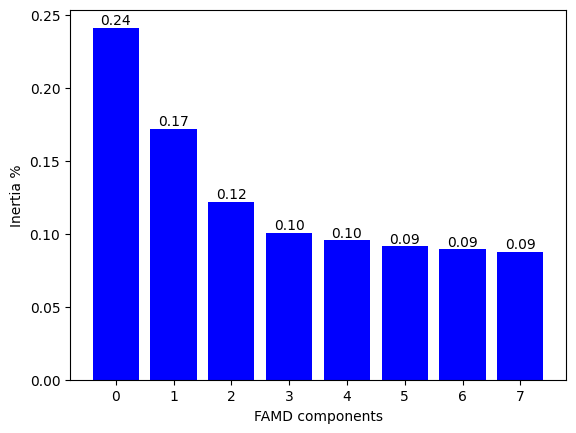

In [29]:
# Create component index for the scree plot
components = range(famd.n_components)

# Plot bar chart of explained inertia per component
bars = plt.bar(components, explained_inertia, color="blue")

# Add value labels on top of each bar
for bar, val in zip(bars, explained_inertia):
    plt.text(
        bar.get_x() + bar.get_width() / 2,  # Center of the bar
        bar.get_height(),                   # Height of the bar
        f"{val:.2f}",                       # Format value to 2 decimals
        ha='center',
        va='bottom'
    )

# Axis labels
plt.xlabel('FAMD components')
plt.ylabel('Inertia %')

# Set x-axis ticks
plt.xticks(components)

# Display the plot
plt.show()


### * The bar chart above gets flat after the 3rd component
### * That's an indication that we need to keep 4 components only as any additional ones will probably add noise rather than variance
### * It's worth verifying this assumption by testing different numbers of components for various numbers of clusters
### * Sihlouette score will be used as a metric of how well K-Means performs

In [30]:
# We will try 4,5,6 and 8 components followed by K-Means with 4 clusters 
for n in [4,5,6,8]:
    famd = prince.FAMD(n_components=n, random_state=42)
    X = famd.fit_transform(df_clust)

    labels = KMeans(n_clusters=4, random_state=42).fit_predict(X)
    score = silhouette_score(X, labels)

    print(n, score)


4 0.3692240213930368
5 0.278830102422382
6 0.2302390763809886
8 0.19310337143545106


In [31]:
# Same numbers of components. K-Means with 5 clusters 
for n in [4,5,6,8]:
    famd = prince.FAMD(n_components=n, random_state=42)
    X = famd.fit_transform(df_clust)

    labels = KMeans(n_clusters=5, random_state=42).fit_predict(X)
    score = silhouette_score(X, labels)

    print(n, score)

4 0.3424959247437873
5 0.2747076017436681
6 0.2471736776061032
8 0.21102136167489677


In [32]:
# 6 clusters finally

for n in [4,5,6,8]:
    famd = prince.FAMD(n_components=n, random_state=42)
    X = famd.fit_transform(df_clust)

    labels = KMeans(n_clusters=6, random_state=42).fit_predict(X)
    score = silhouette_score(X, labels)

    print(n, score)

4 0.32403460506574877
5 0.25202065893166836
6 0.22531617485305014
8 0.1838239086204197


### Some inference here:
### 1. In all 3 cases above, FAMD with 4 components returned the highest Silhouette score when K-Means was applied
### 2. Silhouette score was consistently above 0.3 - sufficiently high score for mixed data
### 3. Four clusters returned higher Sihlouette score than 5 or 6, but determining the right number of clusters would require an Inertia plot and a Sihlouette plot 


In [33]:
def plot_kmeans_elbows(X, k_range=range(2, 11), random_state=42):
    """Creates elbow plots for K-Means clustering using distortion (inertia)
    and silhouette score in order to help select the optimal number of clusters.

    Args:
    X: array-like. The dataset used for clustering (FAMD components).
    k_range: range. Range of k values (number of clusters) to evaluate.
             Default is range(2, 11).
    random_state: int. Random seed for reproducibility of K-Means results.

    Returns:
    Two line plots:
    - Distortion (inertia) vs number of clusters
    - Silhouette score vs number of clusters
    """

    distortions = []   # Stores K-Means inertia values for each k
    silhouettes = []   # Stores silhouette scores for each k

    # Loop through each candidate number of clusters
    for k in k_range:
        # Create and fit K-Means model
        kmeans = KMeans(n_clusters=k, random_state=random_state)
        labels = kmeans.fit_predict(X)   # Cluster assignments

        # Append evaluation metrics
        distortions.append(kmeans.inertia_)          # Sum of squared distances
        silhouettes.append(silhouette_score(X, labels))  # Mean silhouette score

    # --- Distortion (Elbow Method) plot ---
    plt.figure(figsize=(8, 5))
    plt.plot(k_range, distortions, marker='o')
    plt.xlabel("Number of clusters (k)")
    plt.ylabel("Distortion (Inertia)")
    plt.title("Elbow Method (Distortion)")
    plt.grid(True)
    plt.show()

    # --- Silhouette Score plot ---
    plt.figure(figsize=(8, 5))
    plt.plot(k_range, silhouettes, marker='o')
    plt.xlabel("Number of clusters (k)")
    plt.ylabel("Silhouette Score")
    plt.title("Silhouette Analysis")
    plt.grid(True)
    plt.show()


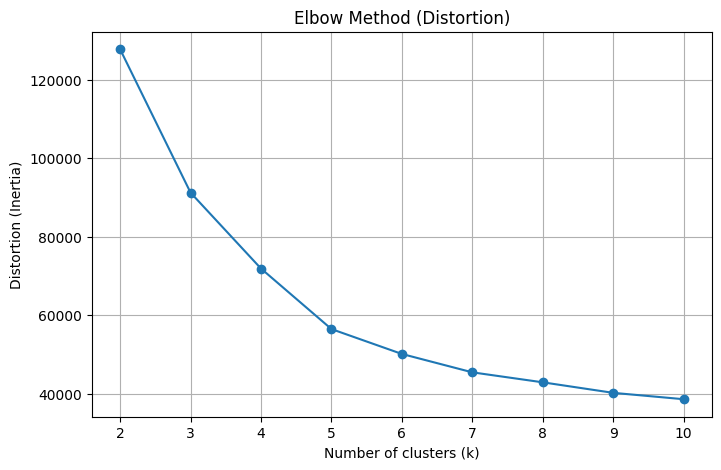

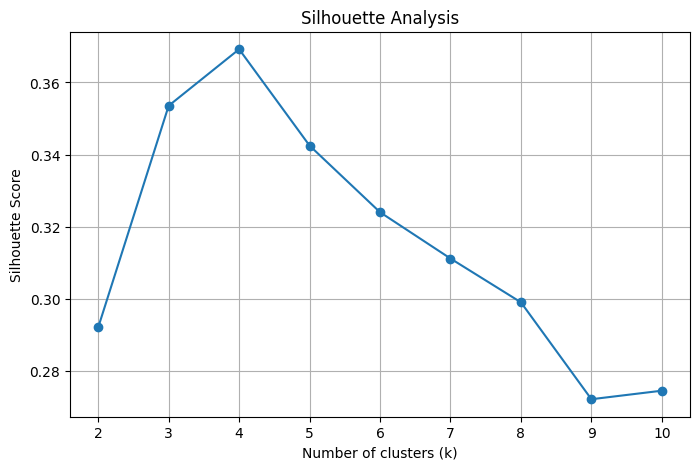

In [34]:
# Create the FAMD model with 4 components
famd = prince.FAMD(n_components=4, random_state=42)

# Fit the FAMD model on the clustering dataset and transform it
df_famd = famd.fit_transform(df_clust)

# Apply K-Means elbow analysis on the FAMD components
# This helps identify the optimal number of clusters using distortion and silhouette scores
plot_kmeans_elbows(df_famd, k_range=range(2, 11))


### * Elbow method shows something between 3 and 5 clusters (graph is pretty straight after 5)
### * Sihlouette analysis confirms previous assumption: 4 is the optimal number of clusters
### * Let's implement the algorithm below

In [35]:
# Fit a K-Means model on the FAMD-transformed data and assign cluster labels
# The output 'labels' contains the cluster assignment for each observation
labels = KMeans(n_clusters=4, random_state=42).fit_predict(df_famd)

# --- K-Means clustering results applied to original data ---

# Create an independent copy of the cleaned dataset to avoid modifying the original
df_profile = df_clean.copy()

# Append the cluster labels to the dataset for profiling and analysis
df_profile['Cluster'] = labels


## Model Evaluation - Validation

### Start with the Silhouette score

In [36]:
# Evaluate the quality of the clustering using the silhouette score
# Higher values indicate better separation and cohesion of clusters

score = silhouette_score(df_famd, labels)
print('The Silhouette score for these clusters is',round(score,2))



The Silhouette score for these clusters is 0.37


### As stated above it's a sufficiently high Silhouette score for mixed data

### Summary of our clusters below

In [37]:
# Calculate population and population % for each of the clusters
cluster_summary = df_profile.groupby('Cluster').size().reset_index(name='Count')
cluster_summary['Percentage'] = round(cluster_summary['Count'] / cluster_summary['Count'].sum() * 100,1)
cluster_summary

,Cluster,Count,Percentage
0,0,4071,50.5
1,1,2517,31.2
2,2,681,8.4
3,3,799,9.9


### * It becomes obvious that we have two big clusters (over 80% of the total population) and two small ones
### * Visualising these clusters would give us a thorough view of how well separated they are and whether having such a big difference between the sizes of the clusters makes sense
### * Start with a 2-D graph based on the first 2 components

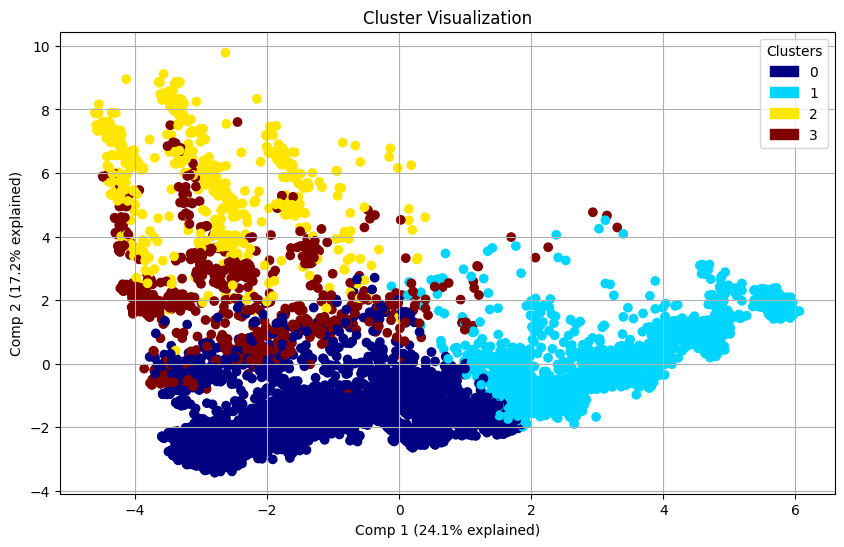

In [38]:
import matplotlib.patches as mpatches

# Create a new figure with a specific size
plt.figure(figsize=(10, 6))

# Extract the first two FAMD components
comp1 = df_famd.to_numpy()[:, 0]
comp2 = df_famd.to_numpy()[:, 1]

# Create a scatter plot coloured by cluster labels
scatter = plt.scatter(comp1, comp2, c=labels, cmap='jet')

# Add plot title
plt.title('Cluster Visualization')

# Label axes with explained variance
plt.xlabel(f'Comp 1 ({explained_inertia[0]*100:.1f}% explained)')
plt.ylabel(f'Comp 2 ({explained_inertia[1]*100:.1f}% explained)')

# Add grid
plt.grid(True)

# Legend
clusters = np.unique(labels)
cmap = scatter.cmap
norm = scatter.norm

legend_handles = [
    mpatches.Patch(
        color=cmap(norm(k)),
        label=f'{k}'
    )
    for k in clusters
]

plt.legend(
    handles=legend_handles,
    title='Clusters',
    frameon=True
)

# Display the plot
plt.show()


### Clusters 0 and 1 look very compact 
### There seems to be some overlap between clusters 2 and 3, even between clusters 0 and 3
### Would a 3-D graph (first 3 components) reveal a clearer relationship between these seemingly ovelapping clusters? 

In [39]:
# Import libraries
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation

# Create a 3D figure
fig = plt.figure(figsize=(9,9))
ax = fig.add_subplot(111, projection='3d')

# Extract the first three FAMD components
x = df_famd.to_numpy()[:, 0]
y = df_famd.to_numpy()[:, 1]
z = df_famd.to_numpy()[:, 2]

# Create a 3D scatter plot colored by cluster labels
scatter = ax.scatter(x, y, z, c=labels, cmap='jet', s=40, alpha=0.8)

# Legend
clusters = np.unique(labels)
cmap = scatter.cmap
norm = scatter.norm

legend_handles = [
    mpatches.Patch(
        color=cmap(norm(k)),
        label=f'{k}'
    )
    for k in clusters
]

ax.legend(
    handles=legend_handles,
    title='Clusters',
    loc='upper right'
)

# Label axes with explained variance
ax.set_xlabel(f'Comp 1 ({explained_inertia[0]*100:.1f}% explained)')
ax.set_ylabel(f'Comp 2 ({explained_inertia[1]*100:.1f}% explained)')
ax.set_zlabel(f'Comp 3 ({explained_inertia[2]*100:.1f}% explained)')

# Add plot title
ax.set_title('3D FAMD Scatter Plot')

# Function to rotate the 3D view
def rotate(angle):
    ax.view_init(elev=20, azim=angle)

# Create the rotation animation
ani = FuncAnimation(
    fig,
    rotate,
    frames=range(0, 360, 2),
    interval=100
)

# Save the animation as a GIF
ani.save("famd_rotation.gif", writer="pillow", fps=10)

# Close the figure to prevent static display
plt.close(fig)


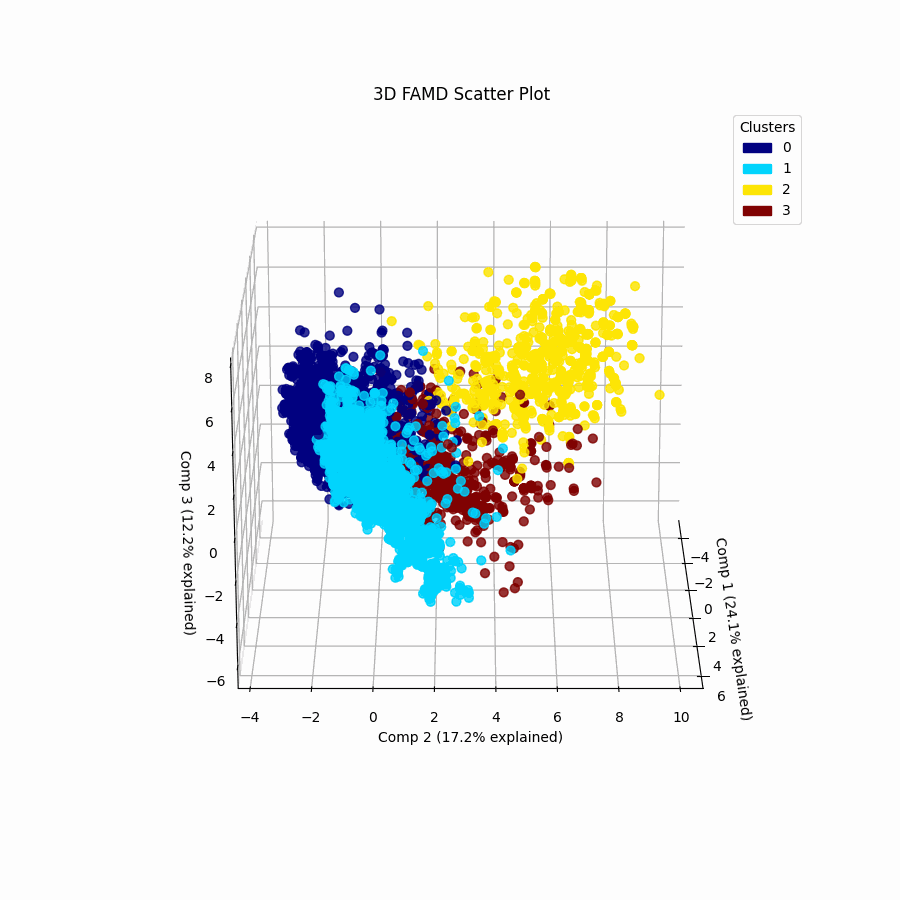

In [40]:
# Display the rotating 3-D graph
from IPython.display import Image
Image(filename="famd_rotation.gif")

### * The rotating 3-D graph shows a clear separation between all 4 clusters
### * First 3 components account for 24.1%+17.2%+12.2%=53.5% of the total inertia - relatively sufficient for inference ratio
### * Therefore having two big and two small clusters makes absolute sense, it's the population density around the centroids that creates this difference    


## Explanatory Analysis - Clusters Visualisation

### As a first step, let's identify which of the initial features contribute the most to the 4 components considered

In [41]:
# Get contribution of each original feature to each FAMD component
var_contrib = famd.column_contributions_

# Convert contributions to percentages per component
var_contrib_pct = var_contrib.div(var_contrib.sum(axis=0), axis=1)

# Sort features by contribution to the first component (descending order)
var_contrib_pct.sort_values(by=0, ascending=False, inplace=True)

# Display feature contribution percentages
print(var_contrib_pct)


component               0         1         2         3
variable                                               
Age              0.260647  0.334067  0.252290  0.372770
Ever_Married     0.246427  0.003027  0.017105  0.003999
Profession       0.218274  0.367246  0.350844  0.450617
Spending_Score   0.179906  0.204896  0.032327  0.060826
Graduated        0.072719  0.072169  0.040146  0.036361
Family_Size      0.015743  0.000659  0.054672  0.007900
Gender           0.003316  0.006776  0.242856  0.059104
Work_Experience  0.002967  0.011161  0.009762  0.008423


### Visualisation is always better than mere numbers

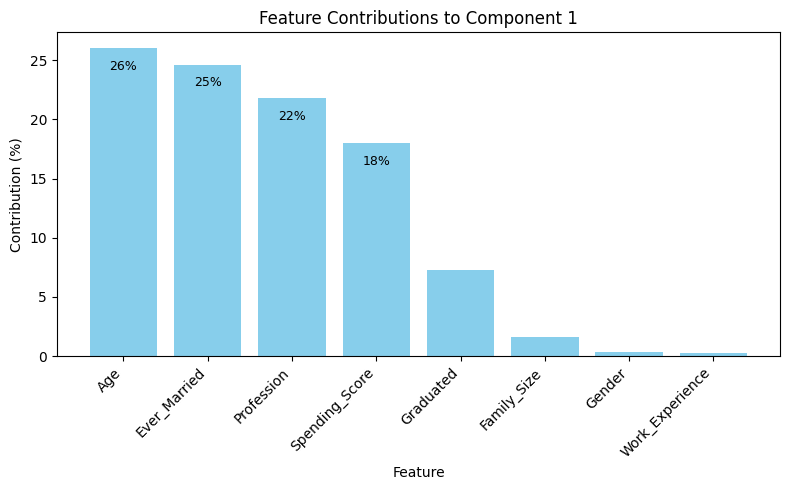

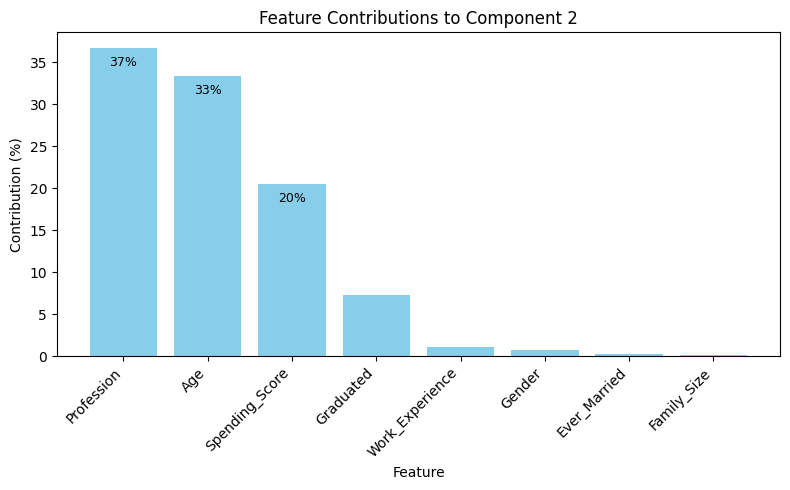

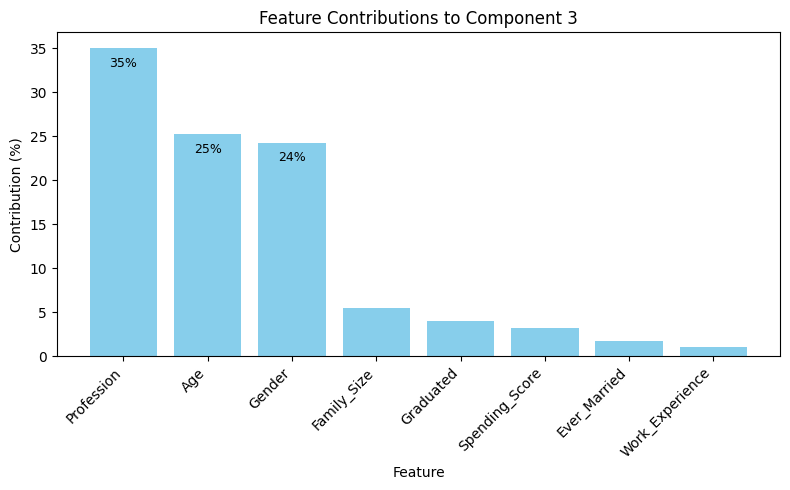

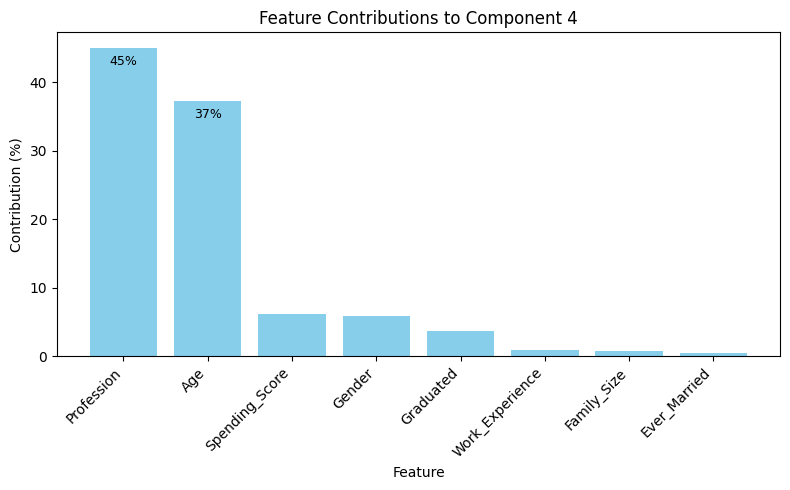

In [42]:
# Bar charts for the contribution of each feature to each of the 4 components
# One bar per component

n_components = var_contrib_pct.shape[1]

for i in range(n_components):
    comp = var_contrib_pct.columns[i]  # component index (0,1,2,3)

    
    # Convert contributions to percentages and sort descending
    sorted_contrib = (var_contrib_pct[comp] * 100).sort_values(ascending=False)
    
    plt.figure(figsize=(8, 5))
    bars = plt.bar(sorted_contrib.index, sorted_contrib.values, color='skyblue')
    
    plt.xticks(rotation=45, ha='right')
    plt.ylabel("Contribution (%)")
    plt.xlabel("Feature")
    plt.title(f"Feature Contributions to Component {comp+1}")
    
    # Add values just below the top of the bar
    for bar, val in zip(bars, sorted_contrib.values):
        if val>15:                                  # Only show if value if bigger than 15%
            plt.text(
                bar.get_x() + bar.get_width() / 2,  # x center
                val - 1,                            # slightly below the top
                f"{val:.0f}%",                      # show as integer percent
                ha='center',
                va='top',                            # align text top with bar
                fontsize=9
        )
    
    plt.tight_layout()
    plt.show()


### 1. Age is the top contributor of the top component and one of the top two contributors of the other 3 components
### 2. Ever Married is almost as important with Age for the top component but (additionally to being very unimportant for the other 3) remember some correlation between Age and Ever Married that a Heatmap above revealed 
### 3. Profession is the top contributor everywhere apart from the first component - even there it's still very important with 22% (3rd biggest)
### 4. Spending Score is among the top 4 contributors for the first two components with considerable contribution %
### 5. Gender is worth considering as it contributes strongy to the 3rd component 
### 6. Before proceeding with all these 5 features, let's explore the relationship between Age and Ever Married in a bit more depth 

In [43]:
# Convert cluster type from integer to object
df_profile.Cluster=df_profile.Cluster.astype('object')

C:\Users\georg\AppData\Local\Temp\ipykernel_19112\4002041328.py:13: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ct = (df_profile.groupby(['Age_group', 'Ever_Married']).size().unstack(fill_value=0))


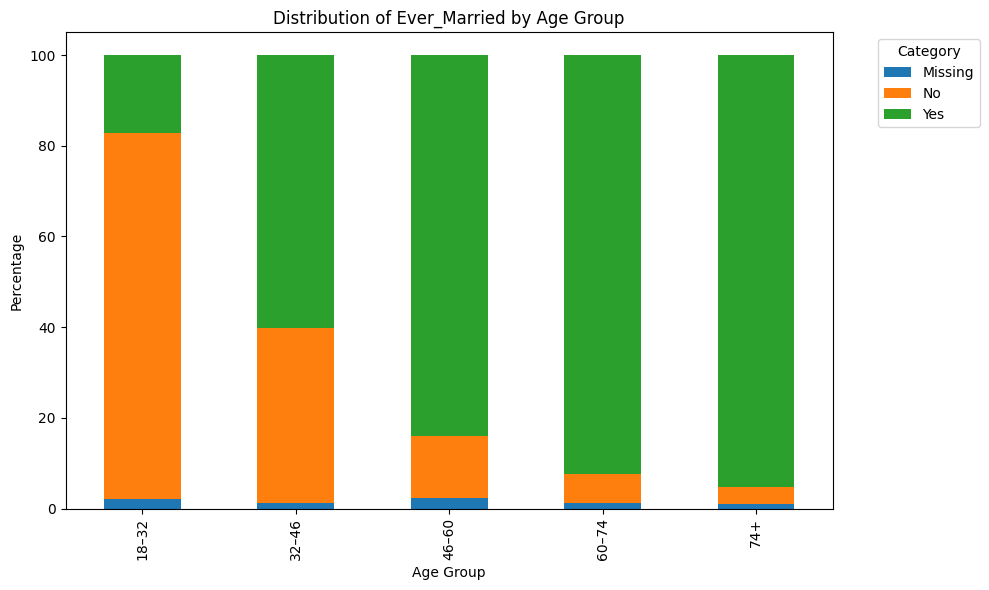

In [44]:
# Create 100% stacked bar chart for the percentage of Ever Married by Age Group

# Define age bin boundaries
age_bins = [18, 33, 47, 61, 75, 89]

# Define labels for each age group
age_labels = ['18–32', '32–46', '46–60', '60–74', '74+']

# Create age group column using the defined bins
df_profile['Age_group'] = pd.cut(df_profile['Age'],bins=age_bins,labels=age_labels,right=False)

# Create contingency table: counts by age group and marital status
ct = (df_profile.groupby(['Age_group', 'Ever_Married']).size().unstack(fill_value=0))

# Convert counts to row-wise percentages
ct_pct = ct.div(ct.sum(axis=1), axis=0) * 100

# Plot stacked bar chart of percentages
ct_pct.plot(kind='bar',stacked=True,figsize=(10, 6))

# Axis labels and title
plt.ylabel('Percentage')
plt.xlabel('Age Group')
plt.title('Distribution of Ever_Married by Age Group')

# Legend placement
plt.legend(title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout and display plot
plt.tight_layout()
plt.show()

# Age Group no longer needed
df_profile.drop('Age_group',axis=1,inplace=True)


### It's obvious that getting older one had an ever bigger chance of having ever been married
### It appears that Age and Ever Married will provide roughly the same information about our clusters
### To make the clusters easily interpretable let's discard Ever Married (least contributor of the two)

### Age visualisation by cluster

<Figure size 600x400 with 0 Axes>

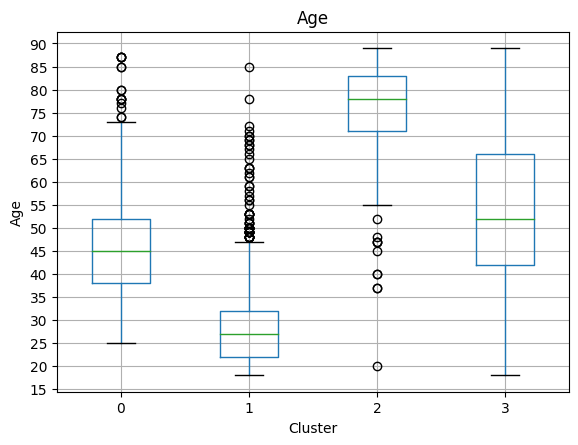

In [45]:
# Import library
from matplotlib.ticker import MultipleLocator

plt.figure(figsize=(6, 4))

# Draw a boxplot of Age grouped by Cluster
ax = df_profile.boxplot(column='Age', by='Cluster')

# Set y-axis major ticks every 5 units
ax.yaxis.set_major_locator(MultipleLocator(5))

# Set plot title
plt.title('Age')

# Remove the automatic groupby subtitle
plt.suptitle("")

# Label the y-axis
plt.ylabel('Age')

# Display the plot
plt.show()


### * Some outliers identified in 3 of 4 clusters
### * Cluster 1 outliers appear to be a concern for two reasons:   
###     1. They are more than in the other two clusters 
###     2. The cluster span almost the whole Age range
### * Let's focus on the summary of the clusters outliers


In [46]:
# List to store outlier statistics per cluster
outliers = []

# Loop through each cluster after removing missing Age values
for cluster, g in df_profile[['Age', 'Cluster']].dropna().groupby('Cluster'):

    # First and third quartiles for Age
    q1, q3 = g['Age'].quantile([0.25, 0.75])

    # Interquartile range (IQR)
    iqr = q3 - q1

    # Define lower and upper bounds using the 1.5 * IQR rule
    lower, upper = q1 - 1.5 * iqr, q3 + 1.5 * iqr

    # Identify outliers outside the IQR bounds
    mask = (g['Age'] < lower) | (g['Age'] > upper)

    # Store outlier counts and percentages for the current cluster
    outliers.append({'Cluster': cluster,
        'Outliers (n)': int(mask.sum()),
        'Total (n)': int(len(g)),
        'Outliers (%)': round(100 * mask.sum() / len(g), 1)
    })

# Convert the results into a DataFrame indexed by Cluster
age_outlier_summary = pd.DataFrame(outliers).set_index('Cluster')

# Transpose for easier comparison across clusters
age_outlier_summary.T


Cluster,0,1,2,3
Outliers (n),16.0,61.0,11.0,0.0
Total (n),4071.0,2517.0,681.0,799.0
Outliers (%),0.4,2.4,1.6,0.0


### * 61 outliers seem to be a lot in the box plot (especially since they cover the whole Age range)
### * Compared to the cluster size though it's only 2.4% of the population - not a concern at all

### Gender and Spending Score only have a few categories so a Stacked Bar Chart should provide simple and informative insight 

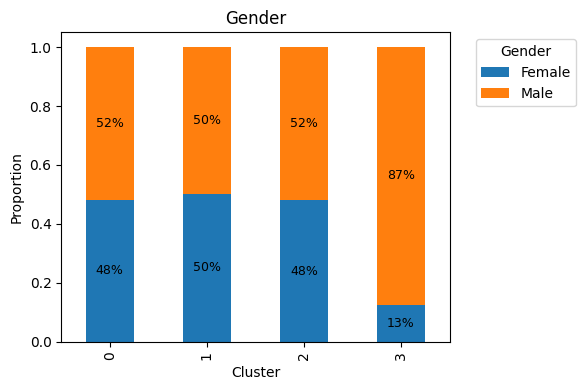

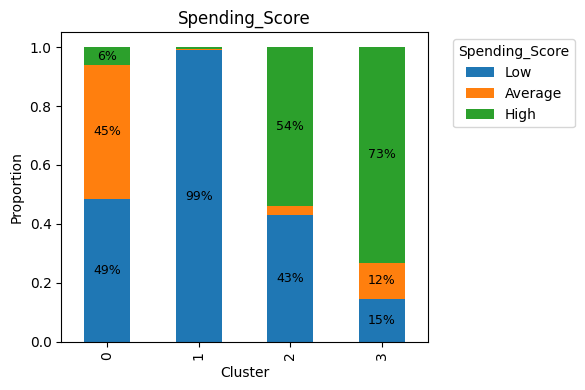

In [47]:
small_cat_cols = ["Gender", "Spending_Score"]

# "Ascending" order for Spending_Score
spending_order = ["Low", "Average", "High"]

# Loop through each categorical variable
for col in small_cat_cols:

    # Compute the proportion of each category within each cluster
    dist = df_profile.groupby("Cluster")[col].value_counts(normalize=True).unstack(fill_value=0)
    

    # Enforce category order for Spending_Score
    if col == "Spending_Score":
        dist = dist.reindex(columns=spending_order)

    # Create a stacked bar chart
    ax = dist.plot(kind="bar",stacked=True,figsize=(6, 4))

    # Add percentage labels inside the bars
    for container in ax.containers:
        for bar in container:
            height = bar.get_height()
            if height > 0.05:  # Skip very small segments
                ax.text(
                    bar.get_x() + bar.get_width() / 2,
                    bar.get_y() + height / 2,
                    f"{height * 100:.0f}%",
                    ha="center",
                    va="center",
                    fontsize=9,
                    color="black"
                )

    # Add legend outside the plot
    ax.legend(title=col,bbox_to_anchor=(1.05, 1),loc="upper left")

    # Set axis labels and title
    ax.set_ylabel("Proportion")
    ax.set_title(col)

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()


### * Cluster 3 is dominated by men - All other clusters are balanced in terms of Gender
### * Cluster 1 is characterised by the almost exclusive presence of low spenders.
### * Some dominance of high spenders in cluster 3

### We have 10 categories for Profession (including missing)
### Let's only visualise top 5 for each cluster - Bar charts will be used

C:\Users\georg\AppData\Local\Temp\ipykernel_19112\525478843.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  profession_counts = df_profile.groupby(['Cluster', 'Profession']).size().unstack(fill_value=0)


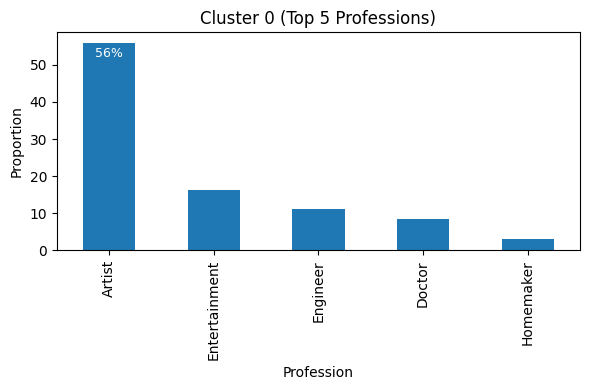

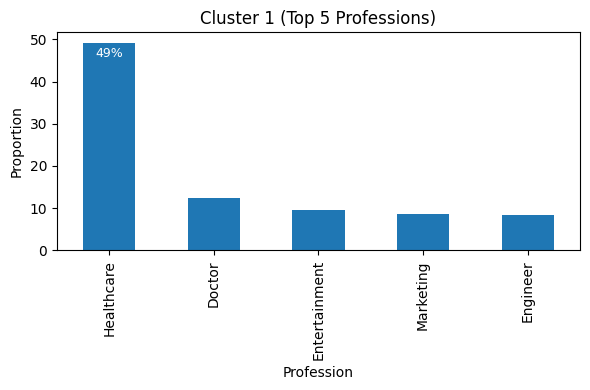

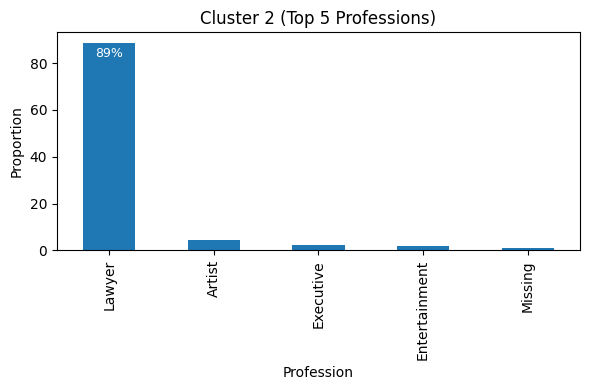

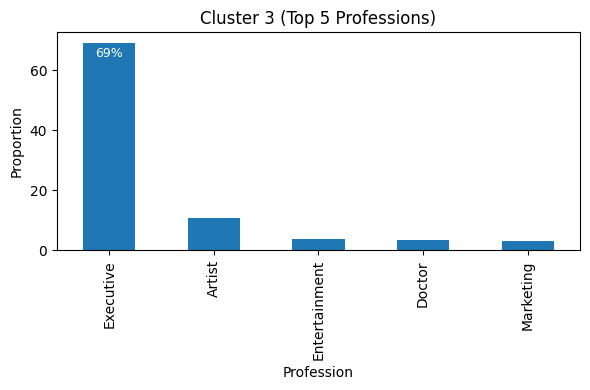

In [48]:
# Count number of customers per Profession within each Cluster
profession_counts = df_profile.groupby(['Cluster', 'Profession']).size().unstack(fill_value=0)

# Convert counts to percentages within each cluster
profession_pct = profession_counts.div(profession_counts.sum(axis=1),axis=0) * 100

# Loop through each cluster
for k in profession_pct.index:

    # Select the top 5 professions by percentage for this cluster
    top = profession_pct.loc[k].sort_values(ascending=False).head(5)

    # Create bar chart
    plt.figure(figsize=(6, 4))
    ax = top.plot(kind="bar")

    # Annotate the first (largest) bar only
    first_value = top.iloc[0]
    ax.text(
        0,                       # x-position of first bar
        first_value*0.95,        # slightly below the top of the bar
        f"{first_value:.0f}%",   # percentage label
        ha='center',
        va='center',
        fontsize=9,
        color='w'
    )

    # Set title and axis label
    plt.title(f"Cluster {k} (Top 5 Professions)")
    plt.ylabel("Proportion")

    # Adjust layout and display plot
    plt.tight_layout()
    plt.show()




## Clusters Interpretation

### Cluster 0: Middle - Aged (mostly 38-52), Low to Average Spenders, Creative Professionals (mainly Artists)
### Cluster 1: Young (75% aged 18-32), Low Spenders, Healthcare Professionals (about 60%)
### Cluster 2: Elderly (75% over 71), Predominantly Legal Professionals, Mainly High Spenders
### Cluster 3: Male, Executives, Predominantly High Spenders 